# Pokemon

<br>

Made by Niklas Munkholm Hjort (60618)

## Introduktion:

This notebook is build using the following dataset from kagle: <br>
- https://www.kaggle.com/lantian773030/pokemonclassification <br>
<br> The CSV file used in the categorization section is also from kaggle however we have done some sorting to match our dataset:
<br>
- https://www.kaggle.com/vishalsubbiah/pokemon-images-and-types?select=pokemon.csv

The dataset is named "7000 labeled pokemon" and it contains 7000 images spread among 150 classed. <br>
It's rather small for this kind of machine learning however as you'll see reading through the different content we have managed to produce some pretty good results. <br>
For the sake of exploration of the many different approaches, methods, and Covnets we have tried building different networks on different amounts of the dataset. 
                                                                 
### Content of notebook: <br>
1. Classification on 4 classes from the dataset.
2. Data augmentation.
3. Classification on 4 classes using VGG16
4. Categoriasation based on the type of the classes
5. Style Transfering using VGG19



### Lavet i samarbejde med:
- Jesper Eriksen
- Jacob Fiversdal (60618)

### OBS: Har tilføjet nogle nye Covnets og overskrifter + andet markdown, så denne notebook variere lidt fra den oprindelige.

In [1]:
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import matplotlib.image as mig
import numpy as np
from pathlib import Path as Dp
import os, shutil
from tensorflow.keras.preprocessing.image import ImageDataGenerator

Defining path and the directory for which our images is stored.

In [2]:
Path =  'C:/Users/45535/Desktop/Deep Learning Python/Datasets/PokemonData'
Image_dir = Dp(Path)

First we will try only to get 4 classes from our dataset (images). 

In [3]:
labels = [item for item in os.listdir(Path)]
labels = np.array(labels)
print(labels.shape)
labels

(150,)


array(['Abra', 'Aerodactyl', 'Alakazam', 'Alolan Sandslash', 'Arbok',
       'Arcanine', 'Articuno', 'Beedrill', 'Bellsprout', 'Blastoise',
       'Bulbasaur', 'Butterfree', 'Caterpie', 'Chansey', 'Charizard',
       'Charmander', 'Charmeleon', 'Clefable', 'Clefairy', 'Cloyster',
       'Cubone', 'Dewgong', 'Diglett', 'Ditto', 'Dodrio', 'Doduo',
       'Dragonair', 'Dragonite', 'Dratini', 'Drowzee', 'Dugtrio', 'Eevee',
       'Ekans', 'Electabuzz', 'Electrode', 'Exeggcute', 'Exeggutor',
       'Farfetchd', 'Fearow', 'Flareon', 'Gastly', 'Gengar', 'Geodude',
       'Gloom', 'Golbat', 'Goldeen', 'Golduck', 'Golem', 'Graveler',
       'Grimer', 'Growlithe', 'Gyarados', 'Haunter', 'Hitmonchan',
       'Hitmonlee', 'Horsea', 'Hypno', 'Ivysaur', 'Jigglypuff', 'Jolteon',
       'Jynx', 'Kabuto', 'Kabutops', 'Kadabra', 'Kakuna', 'Kangaskhan',
       'Kingler', 'Koffing', 'Krabby', 'Lapras', 'Lickitung', 'Machamp',
       'Machoke', 'Machop', 'Magikarp', 'Magmar', 'Magnemite', 'Magneton',
     

Now we have labeled all pokemons we only want 4. We want the following: Charmander, Bulbasaur, Arcanine and Butterfree. <br>
To achieve the we man a selection array and then we use the copy method from numpy to copy these specific labels from our labels array

In [25]:
selection = [11, 15, 5, 10]
selected_labels = np.copy(labels[selection, ])
print(type(selected_labels))
selected_labels

<class 'numpy.ndarray'>


array(['Butterfree', 'Charmander', 'Arcanine', 'Bulbasaur'], dtype='<U16')

We have our 4 labels now i want to get the images for these four classes.

We import the Imagedatagenerator, since i want to split my data once i have it into train and validation.

In [2]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
data_generator = ImageDataGenerator(rescale = 1./255, validation_split=0.2,)

We import the ImageDataGenerator from keras to preprocess our images. <br>
Then we use the function "flow_from_directory" which we give the following parameters (see below) then we tell it to subset for training and validation.

In [20]:
train_data = data_generator.flow_from_directory(Path, target_size=(224,224), batch_size=32, classes = list(selected_labels), subset='training')

valida_data = data_generator.flow_from_directory(Path, target_size=(224,224), batch_size=32, classes = list(selected_labels), subset='validation')

Found 129 images belonging to 4 classes.
Found 31 images belonging to 4 classes.


I have selected 20% of the data for validation. As we can see we have 129 images with 4 labels for training and 31 images with 4 labels for validation. <br>
Not much however it will do for now.

In [74]:
def show_batch(image, label):
  plt.figure(figsize=(10,10))
  for n in range(25):
      ax = plt.subplot(5,5,n+1)
      plt.imshow(image[n])
      plt.title(selected_labels[label[n].argmax()])
      plt.axis('off')

Above i have defined a function for plotting our images. Simply for getting an overview of how our selected classes looks like and if they are labeled correctly.

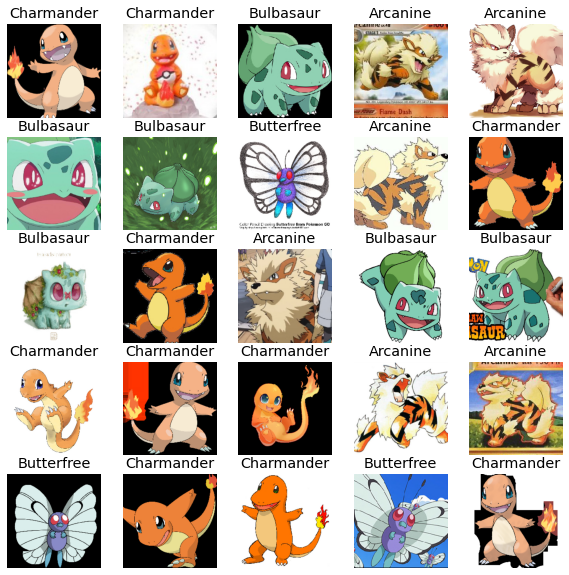

In [75]:
image, label = next(train_data)
show_batch(image, label)

We can see that our images are labeled correct

### Model One
Building a small covnet

At this stage we have converted our images into the right format and labeled them. Lets build a small covnet.

In [4]:
img_shape = (224, 224, 3)

Our input shape is width = 224, height = 224, image channel = 3

The parameters we add to conv2d layer is: <br> filters = 32 <br> kernel size = 3,3 <br> activation function = relu <br> input shape = image shape

In [191]:
from keras import models
from keras import layers

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(img_shape)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(4, activation='sigmoid'))

In [192]:
model.summary()

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_35 (Conv2D)           (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_32 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_33 (MaxPooling (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 52, 52, 128)       73856     
_________________________________________________________________
max_pooling2d_34 (MaxPooling (None, 26, 26, 128)       0         
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 24, 24, 128)     

We can see we have 765,892 parameters for this model. <br> The model is a sequential model from keras <br> We have set the input size equal to the image format (input) <br> the activation function here is relu. <br> For the last layer we set the dense layer shape to 4 which matches the 4 classes we want to predict. We then specify that we want to use the "sigmoid" activation function.

In [193]:
model.compile(optimizer='adam', loss=tf.keras.losses.categorical_crossentropy, metrics=['accuracy'])

hist = model.fit_generator(
    train_data, 
    epochs=25, 
    steps_per_epoch = train_data.samples//32, 
    validation_data=valida_data, 
    validation_steps = valida_data.samples//32)

Epoch 1/25
4/4 [==============================] - 1s 342ms/step - loss: 1.4078 - accuracy: 0.3608 - val_loss: 1.3429 - val_accuracy: 0.3226
Epoch 2/25
4/4 [==============================] - 1s 244ms/step - loss: 1.1785 - accuracy: 0.3608 - val_loss: 0.9760 - val_accuracy: 0.4516
Epoch 3/25
4/4 [==============================] - 1s 338ms/step - loss: 0.9002 - accuracy: 0.5781 - val_loss: 0.7655 - val_accuracy: 0.5806
Epoch 4/25
4/4 [==============================] - 1s 306ms/step - loss: 0.7540 - accuracy: 0.5258 - val_loss: 0.6000 - val_accuracy: 0.5806
Epoch 5/25
4/4 [==============================] - 1s 311ms/step - loss: 0.6365 - accuracy: 0.6186 - val_loss: 0.4992 - val_accuracy: 0.6774
Epoch 6/25
4/4 [==============================] - 1s 305ms/step - loss: 0.6373 - accuracy: 0.6289 - val_loss: 1.3490 - val_accuracy: 0.5484
Epoch 7/25
4/4 [==============================] - 1s 310ms/step - loss: 0.7911 - accuracy: 0.5464 - val_loss: 0.6091 - val_accuracy: 0.7419
Epoch 8/25
4/4 [====

In [175]:
model.save('poke_model.h5')

We use the optimizer adam since it's a common optimizer... <br>
We then use the loss function "categorical crossentropy" for multi class identification.

### Model evaluation

Let's do some plotting to see how our model (covnet) performs.

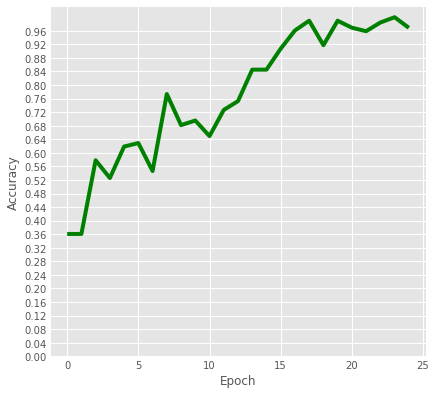

In [197]:
plt.style.use('ggplot')
plt.figure(figsize=(6,6))
plt.plot(hist.history['accuracy'],label='accuracy',color='green')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.yticks(np.arange(0, 1, step=0.04))
plt.show()

We can extract the following from the plot above:
1. The optimizer adam somewhat does what it is supposed to.
2. Our model get's more accurate for each epoch (training session).
<br> <br>
Let's do some more plotting for more insights.

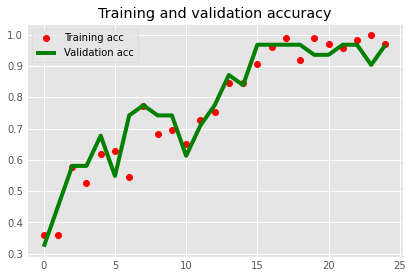

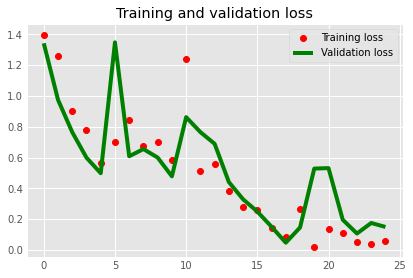

In [198]:
acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))


plt.style.use('ggplot')
plt.plot(epochs, acc, 'bo', label='Training acc', color='red')
plt.plot(epochs, val_acc, 'b', label='Validation acc', color='green')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss', color='red')
plt.plot(epochs, val_loss, 'b', label='Validation loss', color = 'green')
plt.title('Training and validation loss')
plt.legend()

plt.show()

We conclude following: <br>
1. We don't have enought images for training and validation. That proberbly results in the weird graph and the dots are acting weird. <br> 
2. Our model needs to be trained more for it become useful and for our graph to look predictable. <br>
<br> 
However lets do some testing.

### Testing

We will now plot our images with corresponding predicted labels.

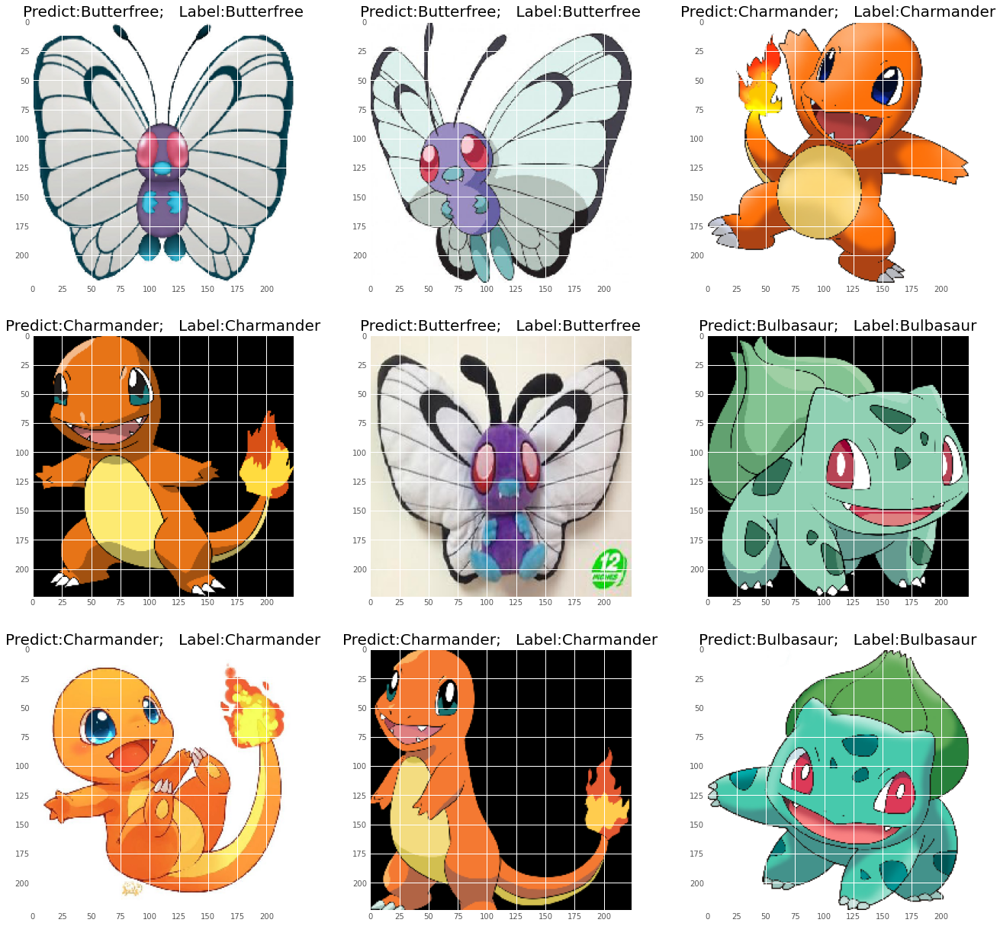

In [201]:
plt.figure(figsize=(20,20))
#for _ in range(3):
sam_x,sam_y = next(valida_data) 
pred_ = model.predict(sam_x)
for i in range(9):
    pred,y = pred_[i].argmax(), sam_y[i].argmax()
    plt.subplot(3,3,i+1)
    plt.imshow(sam_x[i])
    title_ = 'Predict:' + str(selected_labels[pred])+ ';   Label:' + str(selected_labels[y])
    plt.title(title_,size=20)
plt.show()

### conclussion: <br>
1. it can predict all correct
2. it predict all because the dataset is so small + it's the validation data proberbly.
3. Our model is most likely overtrained by looking at the graphs
<br> <br>
We will now use data augmentation as an example since many of the images (see above) are somewhat identical.

## Data Augmentation

We will now define an imagedatagenerator that provides us with new images. <br>
The imagedatagenerator will adjust the pictures according to the parameters we give it.

In [203]:
datagen = ImageDataGenerator(
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

We will now demonstrate how some of our augmented images are going to look. 

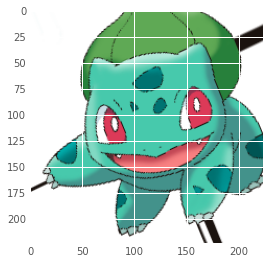

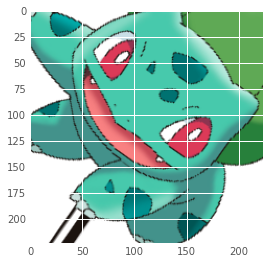

In [257]:
from keras.preprocessing import image

Bulbasaur_path = 'C:/Users/45535/Desktop/Deep Learning Python/Datasets/PokemonData/Bulbasaur'

fnames = [os.path.join(Bulbasaur_path, fname) for fname in os.listdir(Bulbasaur_path)]

selected_bulba_path = fnames[6]

img = image.load_img(selected_bulba_path, target_size=(224,224))

x = image.img_to_array(img)

x = x.reshape((1,) + x.shape)

i = 0
for batch in datagen.flow(x, batch_size=1):
    fig = plt.figure(i)
    plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 2 == 0:
        break

plt.show()

We can have zoomed and rotated the picture. Now we will do it for all the pictures and save to variables. <br>
The purpose of this is to ensure that no image is identical. In other words we increase the level of differentiation between the images. <br>
We do this by adjust how the ImageDataGenerator handles the different images. 

In [26]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    Path, 
    target_size=(224,224), 
    batch_size=32, 
    classes = list(selected_labels), 
    subset='training')

validation_generator = train_datagen.flow_from_directory(
    Path, 
    target_size=(224,224), 
    batch_size=32, 
    classes = list(selected_labels), 
    subset='validation')

Found 129 images belonging to 4 classes.
Found 31 images belonging to 4 classes.


### Model Two

We still have a low number of images however we have now ensured that we don't use the same input twice.

In [28]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(img_shape)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(4, activation='sigmoid'))

model.compile(
    optimizer='adam', 
    loss=tf.keras.losses.categorical_crossentropy, 
    metrics=['accuracy'])

We use the same covnet as before however we have added a dropout layer. Let's test if we get a better result.

In [29]:
hist = model.fit_generator(
    train_generator, 
    epochs=20, 
    steps_per_epoch = train_generator.samples//32, 
    validation_data=validation_generator, 
    validation_steps = validation_generator.samples//32)

Epoch 1/20
4/4 [==============================] - 5s 1s/step - loss: 1.4633 - accuracy: 0.2990 - val_loss: 1.3632 - val_accuracy: 0.3226
Epoch 2/20
4/4 [==============================] - 4s 1s/step - loss: 1.3766 - accuracy: 0.3505 - val_loss: 1.3623 - val_accuracy: 0.3226
Epoch 3/20
4/4 [==============================] - 6s 1s/step - loss: 1.2669 - accuracy: 0.3047 - val_loss: 1.2754 - val_accuracy: 0.3226
Epoch 4/20
4/4 [==============================] - 5s 1s/step - loss: 1.3469 - accuracy: 0.4227 - val_loss: 1.3024 - val_accuracy: 0.5161
Epoch 5/20
4/4 [==============================] - 4s 1s/step - loss: 1.3465 - accuracy: 0.4433 - val_loss: 1.1493 - val_accuracy: 0.5806
Epoch 6/20
4/4 [==============================] - 5s 1s/step - loss: 1.1895 - accuracy: 0.4433 - val_loss: 1.4355 - val_accuracy: 0.3226
Epoch 7/20
4/4 [==============================] - 4s 1s/step - loss: 1.0907 - accuracy: 0.4639 - val_loss: 1.0769 - val_accuracy: 0.5806
Epoch 8/20
4/4 [=========================

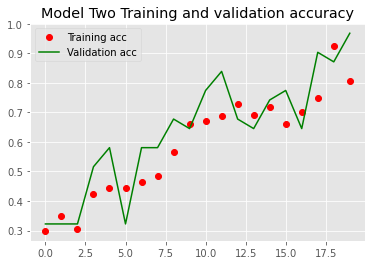

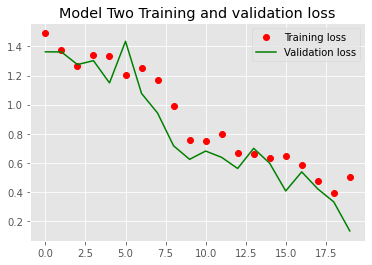

In [31]:
acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))


plt.style.use('ggplot')
plt.plot(epochs, acc, 'bo', label='Training acc', color='red')
plt.plot(epochs, val_acc, 'b', label='Validation acc', color='green')
plt.title('Model Two Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss', color='red')
plt.plot(epochs, val_loss, 'b', label='Validation loss', color = 'green')
plt.title('Model Two Training and validation loss')
plt.legend()

plt.show()

### Model Three

Using softmax

Lets try with the same data but another covnet: <br>
We only change we activation function the last dense layer.


In [32]:
from keras import models
from keras import layers

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(img_shape)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(4, activation='softmax'))

model.compile(
    optimizer='adam', 
    loss=tf.keras.losses.categorical_crossentropy, 
    metrics=['accuracy'])


hist = model.fit_generator(
    train_generator, 
    epochs=20, 
    steps_per_epoch = train_generator.samples//32, 
    validation_data=validation_generator, 
    validation_steps = validation_generator.samples//32)

Epoch 1/20
4/4 [==============================] - 5s 1s/step - loss: 2.2600 - accuracy: 0.2990 - val_loss: 1.9013 - val_accuracy: 0.2581
Epoch 2/20
4/4 [==============================] - 4s 1s/step - loss: 1.4855 - accuracy: 0.2887 - val_loss: 1.3849 - val_accuracy: 0.2581
Epoch 3/20
4/4 [==============================] - 5s 1s/step - loss: 1.3141 - accuracy: 0.2784 - val_loss: 1.2888 - val_accuracy: 0.3226
Epoch 4/20
4/4 [==============================] - 5s 1s/step - loss: 1.2647 - accuracy: 0.2812 - val_loss: 1.0922 - val_accuracy: 0.5806
Epoch 5/20
4/4 [==============================] - 4s 1s/step - loss: 1.0763 - accuracy: 0.4845 - val_loss: 0.8278 - val_accuracy: 0.5806
Epoch 6/20
4/4 [==============================] - 6s 1s/step - loss: 0.8406 - accuracy: 0.5391 - val_loss: 0.6779 - val_accuracy: 0.7097
Epoch 7/20
4/4 [==============================] - 3s 871ms/step - loss: 0.8383 - accuracy: 0.5606 - val_loss: 0.6755 - val_accuracy: 0.6129
Epoch 8/20
4/4 [======================

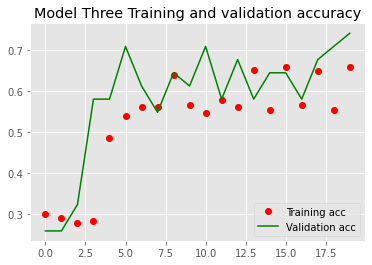

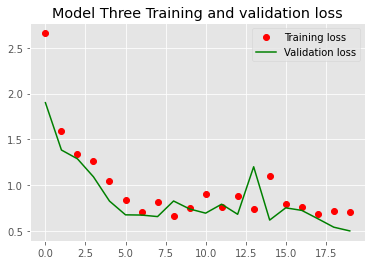

In [33]:
acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))


plt.style.use('ggplot')
plt.plot(epochs, acc, 'bo', label='Training acc', color='red')
plt.plot(epochs, val_acc, 'b', label='Validation acc', color='green')
plt.title('Model Three Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss', color='red')
plt.plot(epochs, val_loss, 'b', label='Validation loss', color = 'green')
plt.title('Model Three Training and validation loss')
plt.legend()

plt.show()

### Model Four

Using average pooling with softmax

In [27]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(img_shape)))
model.add(layers.AveragePooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.AveragePooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.AveragePooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.AveragePooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(4, activation='softmax'))

model.compile(
    optimizer='adam', 
    loss=tf.keras.losses.categorical_crossentropy, 
    metrics=['accuracy'])

hist = model.fit_generator(
    train_generator, 
    epochs=20, 
    steps_per_epoch = train_generator.samples//32, 
    validation_data=validation_generator, 
    validation_steps = validation_generator.samples//32)

Epoch 1/20
4/4 [==============================] - 2s 557ms/step - loss: 1.7479 - accuracy: 0.2784 - val_loss: 1.3491 - val_accuracy: 0.5161
Epoch 2/20
4/4 [==============================] - 1s 363ms/step - loss: 1.2845 - accuracy: 0.4742 - val_loss: 1.3059 - val_accuracy: 0.3871
Epoch 3/20
4/4 [==============================] - 2s 480ms/step - loss: 1.2760 - accuracy: 0.3711 - val_loss: 0.9103 - val_accuracy: 0.7097
Epoch 4/20
4/4 [==============================] - 3s 648ms/step - loss: 0.8215 - accuracy: 0.5859 - val_loss: 0.5826 - val_accuracy: 0.5806
Epoch 5/20
4/4 [==============================] - 2s 403ms/step - loss: 0.7952 - accuracy: 0.5670 - val_loss: 0.5433 - val_accuracy: 0.7419
Epoch 6/20
4/4 [==============================] - 2s 592ms/step - loss: 0.6158 - accuracy: 0.6719 - val_loss: 0.3941 - val_accuracy: 0.8065
Epoch 7/20
4/4 [==============================] - 2s 509ms/step - loss: 0.7799 - accuracy: 0.7010 - val_loss: 0.4237 - val_accuracy: 0.8065
Epoch 8/20
4/4 [====

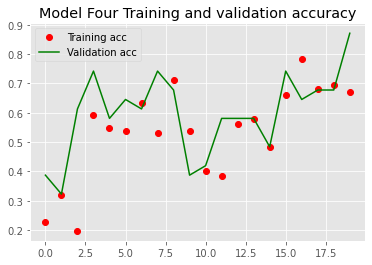

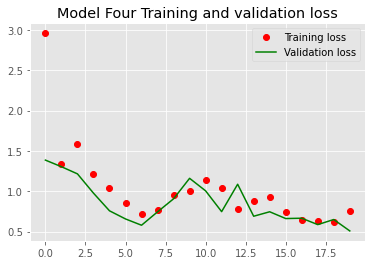

In [37]:
acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))


plt.style.use('ggplot')
plt.plot(epochs, acc, 'bo', label='Training acc', color='red')
plt.plot(epochs, val_acc, 'b', label='Validation acc', color='green')
plt.title('Model Four Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss', color='red')
plt.plot(epochs, val_loss, 'b', label='Validation loss', color = 'green')
plt.title('Model Four Training and validation loss')
plt.legend()

plt.show()

### Model Five
- Added more layers
- Removed dropout

In [46]:
model = models.Sequential()
model.add(layers.Conv2D(32, (4, 4), activation='relu',
                        input_shape=(img_shape)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3,3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(4, activation='sigmoid'))

model.compile(
    optimizer='adam', 
    loss='binary_crossentropy', 
    metrics=['accuracy'])

hist = model.fit_generator(
    train_generator, 
    epochs=20, 
    steps_per_epoch = train_generator.samples//32, 
    validation_data=validation_generator, 
    validation_steps = validation_generator.samples//32)

Epoch 1/20
4/4 [==============================] - 5s 1s/step - loss: 0.6199 - accuracy: 0.6933 - val_loss: 0.5709 - val_accuracy: 0.7500
Epoch 2/20
4/4 [==============================] - 5s 1s/step - loss: 0.5693 - accuracy: 0.7500 - val_loss: 0.5436 - val_accuracy: 0.7500
Epoch 3/20
4/4 [==============================] - 4s 1s/step - loss: 0.5258 - accuracy: 0.7552 - val_loss: 0.4967 - val_accuracy: 0.7500
Epoch 4/20
4/4 [==============================] - 4s 1s/step - loss: 0.5116 - accuracy: 0.7577 - val_loss: 0.4767 - val_accuracy: 0.7581
Epoch 5/20
4/4 [==============================] - 4s 1s/step - loss: 0.4781 - accuracy: 0.7242 - val_loss: 0.4385 - val_accuracy: 0.7258
Epoch 6/20
4/4 [==============================] - 4s 1s/step - loss: 0.4880 - accuracy: 0.7371 - val_loss: 0.3777 - val_accuracy: 0.7742
Epoch 7/20
4/4 [==============================] - 6s 1s/step - loss: 0.4337 - accuracy: 0.7871 - val_loss: 0.4071 - val_accuracy: 0.7823
Epoch 8/20
4/4 [=========================

In [42]:
model.summary()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_46 (Conv2D)           (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_30 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_47 (Conv2D)           (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_31 (MaxPooling (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_48 (Conv2D)           (None, 52, 52, 128)       73856     
_________________________________________________________________
max_pooling2d_32 (MaxPooling (None, 26, 26, 128)       0         
_________________________________________________________________
conv2d_49 (Conv2D)           (None, 24, 24, 64)      

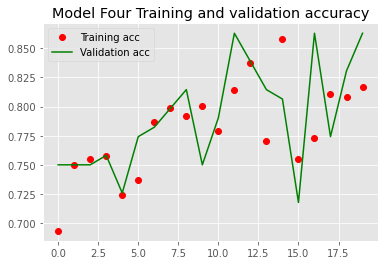

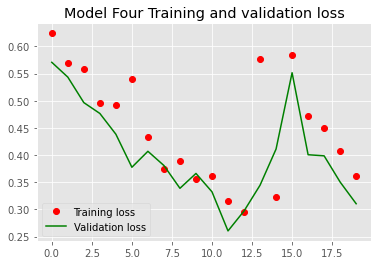

In [47]:
acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))


plt.style.use('ggplot')
plt.plot(epochs, acc, 'bo', label='Training acc', color='red')
plt.plot(epochs, val_acc, 'b', label='Validation acc', color='green')
plt.title('Model Four Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss', color='red')
plt.plot(epochs, val_loss, 'b', label='Validation loss', color = 'green')
plt.title('Model Four Training and validation loss')
plt.legend()

plt.show()

### Conclussion: <br>
1. Our loss plot is somewhat better than before. However the accuracy graph still is still weirdly increasing. <br> 
2. There's no liniar correlation between accuracy and val accuracy. 
3. We need more images pr. label.

## Usage VGG16 

### Model Six

So far we have concluded:
1. That we have a very small dataset. <br>
2. Our training of our covnets isn't predictable (mostly for the augmented images).
<br> <br>
We will se if the VGG16 pretrained covnet can help with the accuracy and loss.


In [279]:
from keras.applications import VGG16

imported_convnet = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(img_shape))
imported_convnet

In [281]:
imported_convnet.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

We can see that there's a lot of layers in VGG16 covnet. <br>
It ends with a two dimensional maxpooling. From there we can flatten is and further specify the out layers (dense layers). 

In [289]:
model = models.Sequential()
model.add(imported_convnet)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(4, activation='sigmoid'))

In [283]:
model.summary()

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_13 (Flatten)         (None, 25088)             0         
_________________________________________________________________
dense_24 (Dense)             (None, 256)               6422784   
_________________________________________________________________
dense_25 (Dense)             (None, 4)                 1028      
Total params: 21,138,500
Trainable params: 21,138,500
Non-trainable params: 0
_________________________________________________________________


The model above uses the VGG16 covnet in a layer. Importnant we will now freeze the layer. This will be done to prevent the additional weights from updating during training.

In [284]:
imported_convnet.trainable = False 

In [285]:
print('This is the number of trainable weights '
      'after freezing the conv base:', len(model.trainable_weights))

This is the number of trainable weights after freezing the conv base: 4


In [292]:
from keras import optimizers
model.compile(optimizer=optimizers.RMSprop(lr=2e-5),
              loss='binary_crossentropy',
              metrics=['acc'])

We want to shift to another optimizer since we want to have an optimzier appropiate for vgg16. 

In [293]:
hist = model.fit_generator(
    train_generator, 
    epochs=20, 
    steps_per_epoch = train_data.samples//32, 
    validation_data=validation_generator, 
    validation_steps = valida_data.samples//32,
    verbose=2
)

Epoch 1/20
 - 2s - loss: 0.5515 - acc: 0.6881 - val_loss: 0.5193 - val_acc: 0.7177
Epoch 2/20
 - 2s - loss: 0.4975 - acc: 0.7500 - val_loss: 0.4379 - val_acc: 0.7581
Epoch 3/20
 - 2s - loss: 0.4247 - acc: 0.8041 - val_loss: 0.3746 - val_acc: 0.8226
Epoch 4/20
 - 2s - loss: 0.3814 - acc: 0.8170 - val_loss: 0.3305 - val_acc: 0.8468
Epoch 5/20
 - 2s - loss: 0.3474 - acc: 0.8531 - val_loss: 0.3235 - val_acc: 0.8710
Epoch 6/20
 - 2s - loss: 0.3580 - acc: 0.8454 - val_loss: 0.2954 - val_acc: 0.9194
Epoch 7/20
 - 2s - loss: 0.3480 - acc: 0.8557 - val_loss: 0.2855 - val_acc: 0.9113
Epoch 8/20
 - 3s - loss: 0.2924 - acc: 0.9043 - val_loss: 0.2662 - val_acc: 0.9113
Epoch 9/20
 - 2s - loss: 0.2784 - acc: 0.9278 - val_loss: 0.2453 - val_acc: 0.9355
Epoch 10/20
 - 2s - loss: 0.2681 - acc: 0.9149 - val_loss: 0.2127 - val_acc: 0.9677
Epoch 11/20
 - 2s - loss: 0.2382 - acc: 0.9021 - val_loss: 0.2154 - val_acc: 0.9435
Epoch 12/20
 - 2s - loss: 0.2162 - acc: 0.9356 - val_loss: 0.1864 - val_acc: 0.9919
E

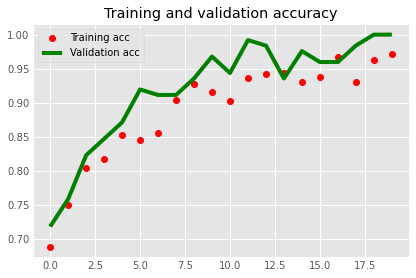

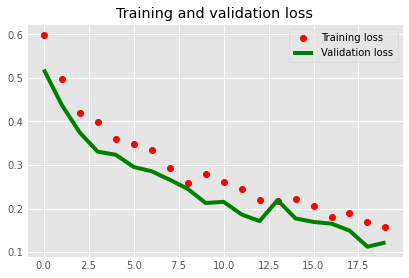

In [295]:
acc = hist.history['acc']
val_acc = hist.history['val_acc']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))


plt.style.use('ggplot')
plt.plot(epochs, acc, 'bo', label='Training acc', color='red')
plt.plot(epochs, val_acc, 'b', label='Validation acc', color='green')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss', color='red')
plt.plot(epochs, val_loss, 'b', label='Validation loss', color = 'green')
plt.title('Training and validation loss')
plt.legend()

plt.show()

### Conclussion

We have way better graphs than the small covnet we used above. <br>
The training accuracy and validation accuracy follows each other which is a positive sign. 
<br> The training loss and accuracy is somewhat liniar which is a good indication. 
<br> We don't need to train the model further since we don't want overtraining. 

Lets predict with VGG16

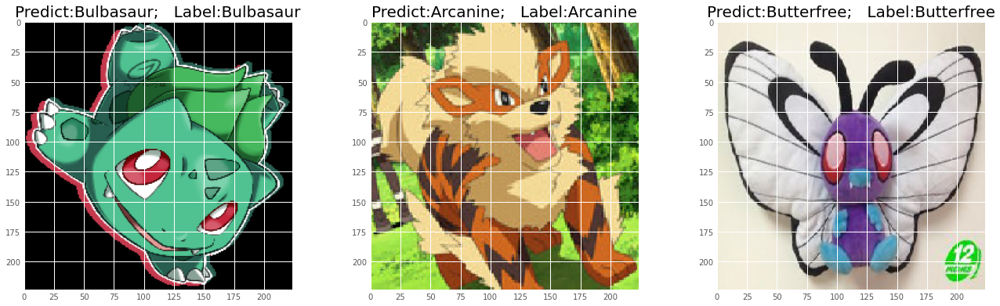

In [298]:
plt.figure(figsize=(20,20))
#for _ in range(3):
sam_x,sam_y = next(valida_data) 
pred_ = model.predict(sam_x)
for i in range(3):
    pred,y = pred_[i].argmax(), sam_y[i].argmax()
    plt.subplot(3,3,i+1)
    plt.imshow(sam_x[i])
    title_ = 'Predict:' + str(selected_labels[pred])+ ';   Label:' + str(selected_labels[y])
    plt.title(title_,size=20)
plt.show()

100 % accuraticy based on the three pictures above. <br> 
Now lets train our model on all pokemon images.

## Classification of all pokemons

### Model Seven

For this section of our notebook we will will repeat the same actions from above on all out classes.

In [6]:
all_pokemons = [item for item in os.listdir(Path)]
all_pokemons = np.array(labels)
all_pokemons

array(['Abra', 'Aerodactyl', 'Alakazam', 'Alolan Sandslash', 'Arbok',
       'Arcanine', 'Articuno', 'Beedrill', 'Bellsprout', 'Blastoise',
       'Bulbasaur', 'Butterfree', 'Caterpie', 'Chansey', 'Charizard',
       'Charmander', 'Charmeleon', 'Clefable', 'Clefairy', 'Cloyster',
       'Cubone', 'Dewgong', 'Diglett', 'Ditto', 'Dodrio', 'Doduo',
       'Dragonair', 'Dragonite', 'Dratini', 'Drowzee', 'Dugtrio', 'Eevee',
       'Ekans', 'Electabuzz', 'Electrode', 'Exeggcute', 'Exeggutor',
       'Farfetchd', 'Fearow', 'Flareon', 'Gastly', 'Gengar', 'Geodude',
       'Gloom', 'Golbat', 'Goldeen', 'Golduck', 'Golem', 'Graveler',
       'Grimer', 'Growlithe', 'Gyarados', 'Haunter', 'Hitmonchan',
       'Hitmonlee', 'Horsea', 'Hypno', 'Ivysaur', 'Jigglypuff', 'Jolteon',
       'Jynx', 'Kabuto', 'Kabutops', 'Kadabra', 'Kakuna', 'Kangaskhan',
       'Kingler', 'Koffing', 'Krabby', 'Lapras', 'Lickitung', 'Machamp',
       'Machoke', 'Machop', 'Magikarp', 'Magmar', 'Magnemite', 'Magneton',
     

In [329]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2)

train_data = train_datagen.flow_from_directory(Path, 
                                                target_size=(224,224), 
                                                batch_size=32, 
                                                classes = list(all_pokemons), 
                                                subset='training')

valida_data = train_datagen.flow_from_directory(Path, 
                                                 target_size=(224,224), 
                                                 batch_size=32, 
                                                 classes = list(all_pokemons), 
                                                 subset='validation')

model = models.Sequential()
model.add(imported_convnet)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(150, activation='softmax'))


model.compile(
    optimizer='adam', 
    loss=tf.keras.losses.categorical_crossentropy, 
    metrics=['accuracy'])


hist = model.fit_generator(
    train_data, 
    epochs=15, 
    steps_per_epoch = train_data.samples//32, 
    validation_data= valida_data, 
    validation_steps = valida_data.samples//32,
    verbose=2
)

Found 5511 images belonging to 150 classes.
Found 1309 images belonging to 150 classes.
Epoch 1/15
 - 80s - loss: 4.9983 - accuracy: 0.0217 - val_loss: 4.8789 - val_accuracy: 0.0305
Epoch 2/15
 - 82s - loss: 4.5167 - accuracy: 0.0485 - val_loss: 4.3319 - val_accuracy: 0.0877
Epoch 3/15
 - 89s - loss: 3.9176 - accuracy: 0.1164 - val_loss: 3.5512 - val_accuracy: 0.1363
Epoch 4/15
 - 98s - loss: 3.5373 - accuracy: 0.1661 - val_loss: 3.5805 - val_accuracy: 0.1746
Epoch 5/15
 - 89s - loss: 3.3174 - accuracy: 0.2075 - val_loss: 3.1462 - val_accuracy: 0.2005
Epoch 6/15
 - 99s - loss: 3.1640 - accuracy: 0.2280 - val_loss: 2.9458 - val_accuracy: 0.2060
Epoch 7/15
 - 81s - loss: 3.0453 - accuracy: 0.2530 - val_loss: 2.9649 - val_accuracy: 0.2420
Epoch 8/15
 - 81s - loss: 2.9416 - accuracy: 0.2628 - val_loss: 3.0085 - val_accuracy: 0.2435
Epoch 9/15
 - 84s - loss: 2.8907 - accuracy: 0.2763 - val_loss: 2.5297 - val_accuracy: 0.2670
Epoch 10/15
 - 82s - loss: 2.8467 - accuracy: 0.2869 - val_loss: 2

In [330]:
model.save('allpokeVGG16.h5')

Finally lets test our model on all pokemon.

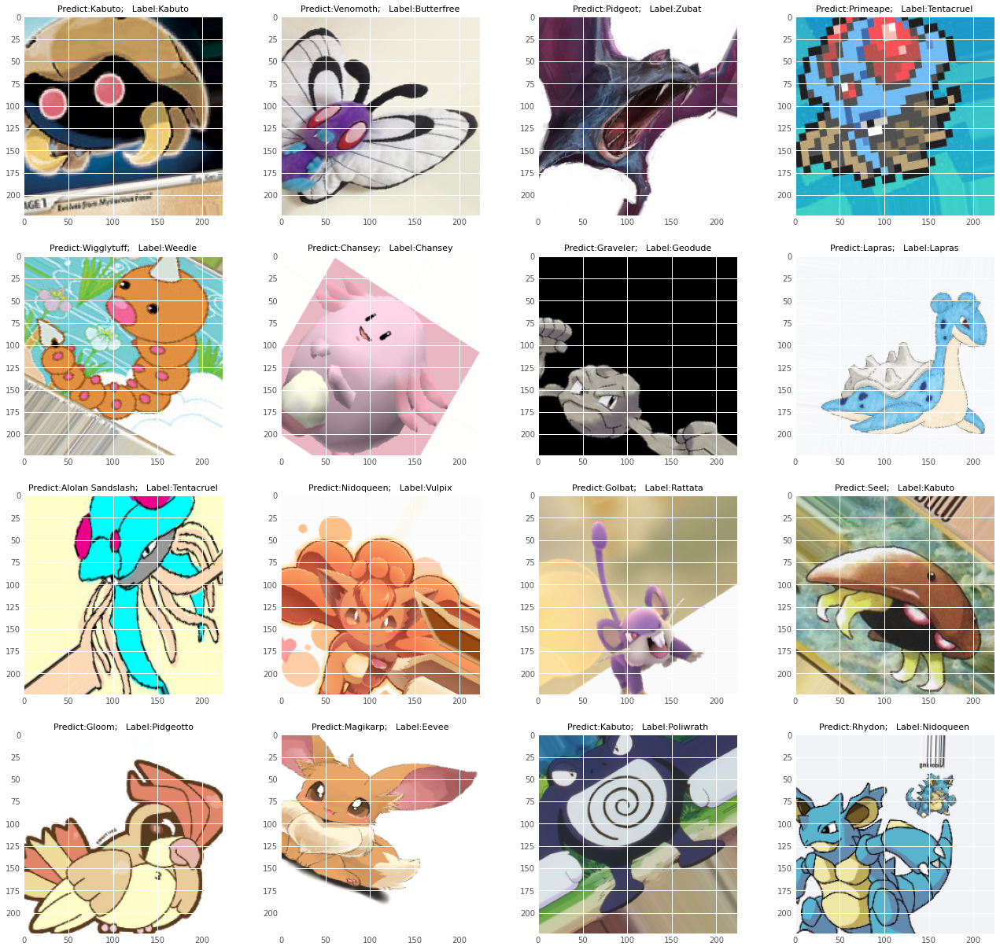

In [331]:
plt.figure(figsize=(20,20))
#for _ in range(3):
sam_x,sam_y = next(valida_data) 
pred_ = model.predict(sam_x)
for i in range(16):
    pred,y = pred_[i].argmax(), sam_y[i].argmax()
    plt.subplot(4,4,i+1)
    plt.imshow(sam_x[i])
    title_ = 'Predict:' + str(all_pokemons[pred])+ ';   Label:' + str(all_pokemons[y])
    plt.title(title_,size=11)
plt.show()

This matched the accuracy score. Very nice!

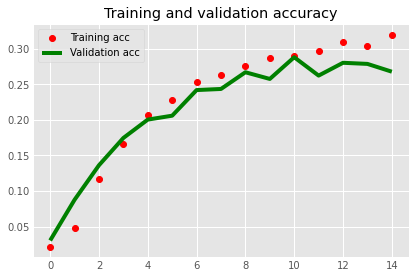

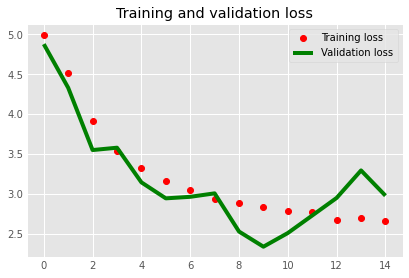

In [333]:
acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))


plt.style.use('ggplot')
plt.plot(epochs, acc, 'bo', label='Training acc', color='red')
plt.plot(epochs, val_acc, 'b', label='Validation acc', color='green')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss', color='red')
plt.plot(epochs, val_loss, 'b', label='Validation loss', color = 'green')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# Categorization

### Model 8

We have decided to use a csv reference file to split out labels (pokemon classes) into type. (See the picture below where we illustrate how this is done manually).
Each pokemon (class) has a type now. <br> 
We have to cast these types from csv to our image files, and from there label them. 

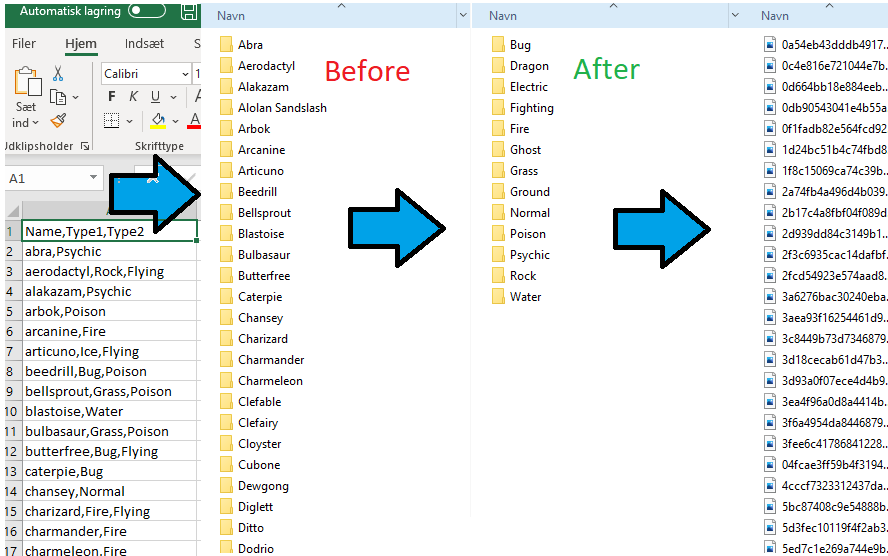

In [4]:
from IPython.display import Image
Image(filename='C:/Users/45535/Desktop/Deep Learning Python/EKSAMEN_NOTEBOOKS/File_for_categorization.png')

Before each folder was labeled with the name of the specific pokemon. Now we have extracted the images and created a folder matching the type of that pokemon corresponding to the information in the csv file. 

In [7]:
pokemon_filenames = np.array(os.listdir(Path))
pokemon_filenames

array(['Abra', 'Aerodactyl', 'Alakazam', 'Alolan Sandslash', 'Arbok',
       'Arcanine', 'Articuno', 'Beedrill', 'Bellsprout', 'Blastoise',
       'Bulbasaur', 'Butterfree', 'Caterpie', 'Chansey', 'Charizard',
       'Charmander', 'Charmeleon', 'Clefable', 'Clefairy', 'Cloyster',
       'Cubone', 'Dewgong', 'Diglett', 'Ditto', 'Dodrio', 'Doduo',
       'Dragonair', 'Dragonite', 'Dratini', 'Drowzee', 'Dugtrio', 'Eevee',
       'Ekans', 'Electabuzz', 'Electrode', 'Exeggcute', 'Exeggutor',
       'Farfetchd', 'Fearow', 'Flareon', 'Gastly', 'Gengar', 'Geodude',
       'Gloom', 'Golbat', 'Goldeen', 'Golduck', 'Golem', 'Graveler',
       'Grimer', 'Growlithe', 'Gyarados', 'Haunter', 'Hitmonchan',
       'Hitmonlee', 'Horsea', 'Hypno', 'Ivysaur', 'Jigglypuff', 'Jolteon',
       'Jynx', 'Kabuto', 'Kabutops', 'Kadabra', 'Kakuna', 'Kangaskhan',
       'Kingler', 'Koffing', 'Krabby', 'Lapras', 'Lickitung', 'Machamp',
       'Machoke', 'Machop', 'Magikarp', 'Magmar', 'Magnemite', 'Magneton',
     

In [8]:
import pandas as pd
Pokemon_data = pd.read_csv('C:/Users/45535/Desktop/Deep Learning Python/Datasets/pokemon.csv')
Pokemon_data

,Name,Type1,Type2
0,abra,Psychic,NaN
1,aerodactyl,Rock,Flying
2,alakazam,Psychic,NaN
3,arbok,Poison,NaN
4,arcanine,Fire,NaN
...,...,...,...
144,weepinbell,Grass,Poison
145,weezing,Poison,NaN
146,wigglytuff,Normal,Fairy
147,zapdos,Electric,Flying


We have moved all files in all subdirectores to one folder that has the type name if the subdirectory matches the name column in pokemon_data (csv)

In [3]:
type_path = 'C:/Users/45535/Desktop/Deep Learning Python/Datasets/Pokemon_types'

In [4]:
labels = [item for item in os.listdir(type_path)]
labels = np.array(labels)
print(labels.shape)
labels

(13,)


array(['Bug', 'Dragon', 'Electric', 'Fighting', 'Fire', 'Ghost', 'Grass',
       'Ground', 'Normal', 'Poison', 'Psychic', 'Rock', 'Water'],
      dtype='<U8')

In [5]:
data_generator = ImageDataGenerator(rescale = 1./255, validation_split=0.2,)
img_shape = (224, 224, 3)

In [26]:
train_data = data_generator.flow_from_directory(type_path, 
                                                target_size=(224,224), 
                                                batch_size=32, 
                                                class_mode='categorical',
                                                classes = list(labels), 
                                                subset='training',  )

valida_data = data_generator.flow_from_directory(type_path,
                                                 target_size=(224,224), 
                                                 batch_size=32, 
                                                 class_mode='categorical',
                                                 classes = list(labels), 
                                                 subset='validation')

Found 5478 images belonging to 13 classes.
Found 1364 images belonging to 13 classes.


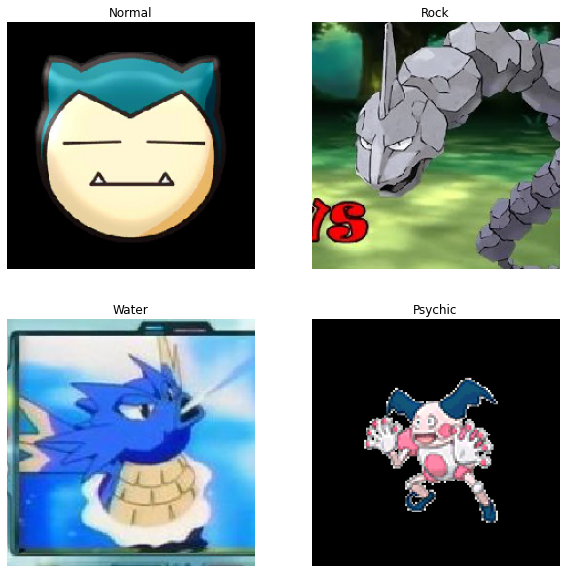

In [13]:
def show_batch(image, label):
  plt.figure(figsize=(10,10))
  for n in range(4):
      ax = plt.subplot(2,2,n+1)
      plt.imshow(image[n])
      plt.title(labels[label[n].argmax()])
      plt.axis('off')


image, label = next(train_data)
show_batch(image, label)

In [14]:
from keras import models
from keras import layers


model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(img_shape)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(13, activation='softmax'))

model.compile(
    optimizer='adam', 
    loss=tf.keras.losses.categorical_crossentropy, 
    metrics=['accuracy'])

histTwo = model.fit_generator(
    train_data, 
    epochs=10, 
    steps_per_epoch = train_data.samples//32, 
    validation_data=valida_data, 
    validation_steps = valida_data.samples//32)

Using TensorFlow backend.


Epoch 1/10
  3/171 [..............................] - ETA: 4:10 - loss: 3.0850 - accuracy: 0.0833  

C:\Users\45535\anaconda3\envs\AI_keras_env\lib\site-packages\PIL\Image.py:961: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


171/171 [==============================] - 226s 1s/step - loss: 2.1979 - accuracy: 0.2846 - val_loss: 2.1098 - val_accuracy: 0.3564
Epoch 2/10
171/171 [==============================] - 221s 1s/step - loss: 1.9122 - accuracy: 0.3669 - val_loss: 1.9031 - val_accuracy: 0.4062
Epoch 3/10
171/171 [==============================] - 221s 1s/step - loss: 1.6466 - accuracy: 0.4574 - val_loss: 1.1893 - val_accuracy: 0.4955
Epoch 4/10
171/171 [==============================] - 218s 1s/step - loss: 1.2903 - accuracy: 0.5757 - val_loss: 1.4121 - val_accuracy: 0.5480
Epoch 5/10
171/171 [==============================] - 219s 1s/step - loss: 1.0240 - accuracy: 0.6620 - val_loss: 1.4624 - val_accuracy: 0.5571
Epoch 6/10
171/171 [==============================] - 218s 1s/step - loss: 0.7614 - accuracy: 0.7459 - val_loss: 1.5509 - val_accuracy: 0.6254
Epoch 7/10
171/171 [==============================] - 224s 1s/step - loss: 0.5775 - accuracy: 0.8063 - val_loss: 1.5675 - val_accuracy: 0.6299
Epoch 8/10

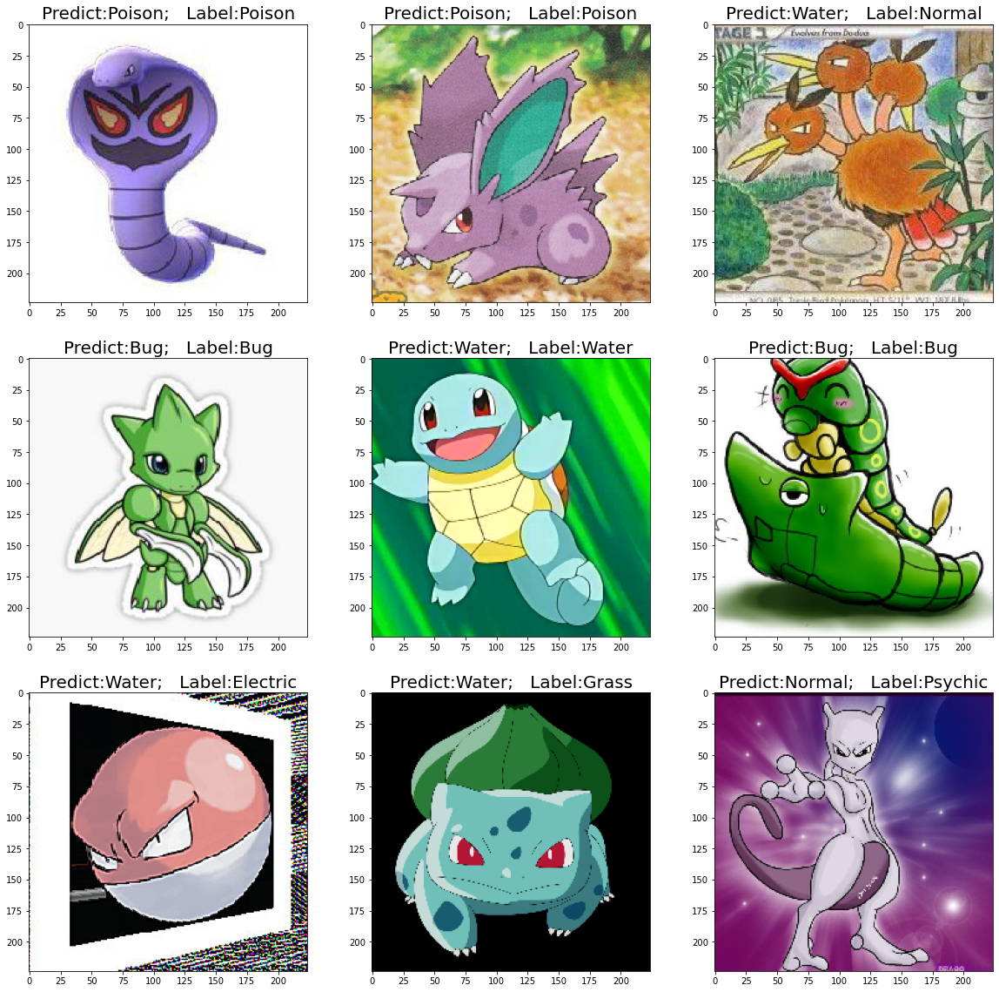

In [54]:
plt.figure(figsize=(20,20))
sam_x,sam_y = next(valida_data) 
pred_ = model.predict(sam_x)
for i in range(9):
    pred,y = pred_[i].argmax(), sam_y[i].argmax()
    plt.subplot(3,3,i+1)
    plt.imshow(sam_x[i])
    title_ = 'Predict:' + str(labels[pred])+ ';   Label:' + str(labels[y])
    plt.title(title_,size=20)
plt.show()

Let's plot to visualize how our model performs.

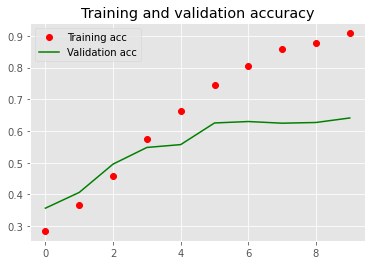

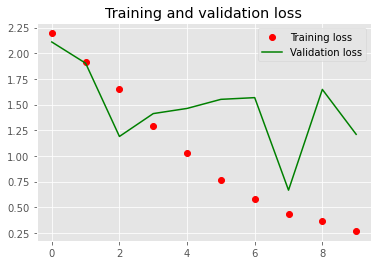

In [67]:
acc = histTwo.history['accuracy']
val_acc = histTwo.history['val_accuracy']
loss = histTwo.history['loss']
val_loss = histTwo.history['val_loss']

epochs = range(len(acc))


plt.style.use('ggplot')
plt.plot(epochs, acc, 'bo', label='Training acc', color='red')
plt.plot(epochs, val_acc, 'b', label='Validation acc', color='green')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss', color='red')
plt.plot(epochs, val_loss, 'b', label='Validation loss', color = 'green')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Lets test the covnet above on random test data collected from the random google searches. <br>
These classes is generation two pokemon which have slighty new designs and other colors which makes this interressting.

In [11]:
test_path = 'C:/Users/45535/Desktop/Deep Learning Python/Datasets/Gen2Testdata'


print('total test images', len(os.listdir(test_path)))
test_datagen = ImageDataGenerator(rescale=1./255)

labels_test = [item for item in os.listdir(test_path)]
labels_test = np.array(labels_test)
print(labels_test.shape)
labels_test

test_generator = test_datagen.flow_from_directory(
        test_path,
        target_size=(224, 224),
        batch_size=20,
        classes = list(labels_test))






total test images 2
(2,)
Found 19 images belonging to 2 classes.


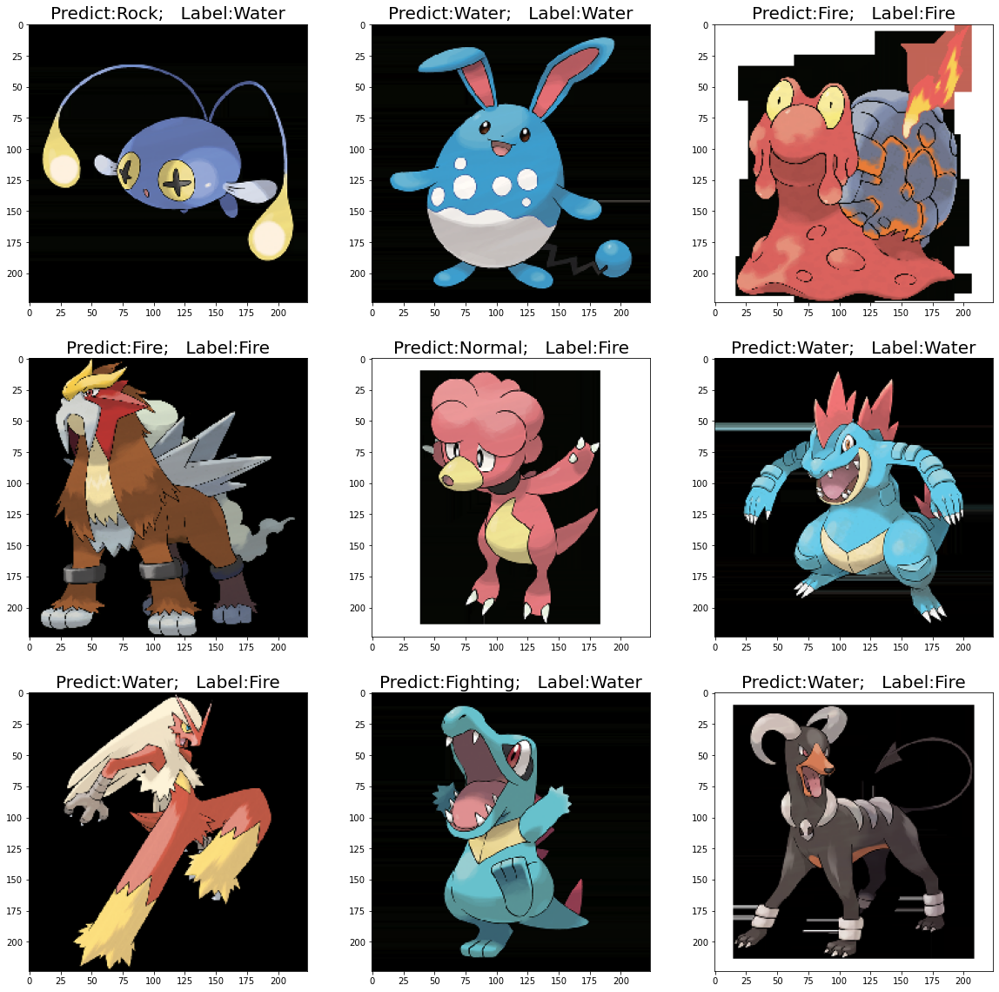

In [65]:
plt.figure(figsize=(20,20))
sam_x,sam_y = next(test_generator) 
pred_ = model.predict(sam_x)
for i in range(9):
    pred,y = pred_[i].argmax(), sam_y[i].argmax()
    plt.subplot(3,3,i+1)
    plt.imshow(sam_x[i])
    title_ = 'Predict:' + str(labels[pred])+ ';   Label:' + str(labels_test[y])
    plt.title(title_,size=20)
plt.show()

### Model 9 + 10
Idenfication of all pokemon with type labels using VGG16 and proper training (Optimizer)

In [ ]:

model = models.Sequential()
model.add(layers.Conv2D(input_shape=img_shape, filters=32, 
                 use_bias=True, kernel_size=(3,3)))
model.add(layers.Activation('relu'))
model.add(layers.Dropout(0.1))
model.add(layers.Conv2D(filters=64, use_bias=False, kernel_size=(5,5), strides=2))
model.add(layers.Activation('relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Flatten())
model.add(layers.Dense(128))
model.add(layers.Activation('relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(13, activation="softmax"))

data_generator = ImageDataGenerator(
      rescale = 1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest',
      validation_split = 0.2)



model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

data_generator = ImageDataGenerator(rescale = 1./255, validation_split=0.2,)


In [33]:
from keras.applications import VGG19
from keras import models
from keras import layers
from keras import optimizers


data_generator = ImageDataGenerator(rescale = 1./255, validation_split=0.2,)

img_shape = (224, 224, 3)

train_data = data_generator.flow_from_directory(type_path, 
                                                target_size=(224,224), 
                                                batch_size=32, 
                                                class_mode='categorical',
                                                classes = list(labels), 
                                                subset='training',  )

valida_data = data_generator.flow_from_directory(type_path,
                                                 target_size=(224,224), 
                                                 batch_size=32, 
                                                 class_mode='categorical',
                                                 classes = list(labels), 
                                                 subset='validation')

imported_convnet = VGG19(weights='imagenet',
                  include_top=False,
                  input_shape=(img_shape))
imported_convnet

imported_convnet.trainable = False 


model = models.Sequential()
model.add(imported_convnet)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(13, activation='softmax'))



model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['acc'])


hist = model.fit_generator(
    train_data, 
    epochs=20, 
    steps_per_epoch = 100, 
    validation_data= valida_data, 
    validation_steps = 50,
    verbose=2
)

Found 5478 images belonging to 13 classes.
Found 1364 images belonging to 13 classes.
Epoch 1/20


C:\Users\45535\anaconda3\envs\AI_keras_env_GPU\lib\site-packages\PIL\Image.py:952: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


 - 37s - loss: 2.3728 - acc: 0.3982 - val_loss: 1.5551 - val_acc: 0.5428
Epoch 2/20
 - 38s - loss: 1.0878 - acc: 0.6722 - val_loss: 1.1799 - val_acc: 0.6379
Epoch 3/20
 - 38s - loss: 0.5833 - acc: 0.8333 - val_loss: 0.8709 - val_acc: 0.6543
Epoch 4/20
 - 38s - loss: 0.4560 - acc: 0.8705 - val_loss: 0.6865 - val_acc: 0.7072
Epoch 5/20
 - 38s - loss: 0.3300 - acc: 0.9081 - val_loss: 1.4220 - val_acc: 0.6134
Epoch 6/20
 - 38s - loss: 0.2144 - acc: 0.9497 - val_loss: 0.7976 - val_acc: 0.6795
Epoch 7/20
 - 37s - loss: 0.1413 - acc: 0.9710 - val_loss: 0.8540 - val_acc: 0.7278
Epoch 8/20
 - 38s - loss: 0.0871 - acc: 0.9872 - val_loss: 0.7743 - val_acc: 0.7267
Epoch 9/20
 - 38s - loss: 0.0793 - acc: 0.9877 - val_loss: 0.8452 - val_acc: 0.7298
Epoch 10/20
 - 38s - loss: 0.0631 - acc: 0.9897 - val_loss: 1.1411 - val_acc: 0.7236
Epoch 11/20
 - 38s - loss: 0.0492 - acc: 0.9909 - val_loss: 1.0836 - val_acc: 0.7374
Epoch 12/20
 - 38s - loss: 0.0579 - acc: 0.9902 - val_loss: 1.0947 - val_acc: 0.7418


In [34]:
model.save('model_9.h5')

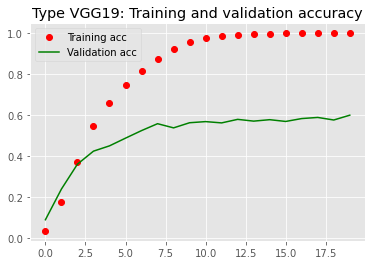

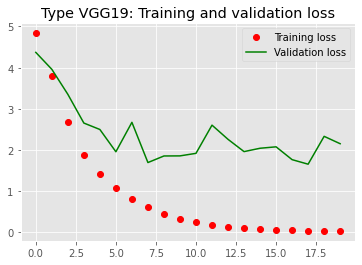

In [54]:
acc = hist.history['acc']
val_acc = hist.history['val_acc']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))


plt.style.use('ggplot')
plt.plot(epochs, acc, 'bo', label='Training acc', color='red')
plt.plot(epochs, val_acc, 'b', label='Validation acc', color='green')
plt.title('Type VGG19: Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss', color='red')
plt.plot(epochs, val_loss, 'b', label='Validation loss', color = 'green')
plt.title('Type VGG19: Training and validation loss')
plt.legend()

plt.show()

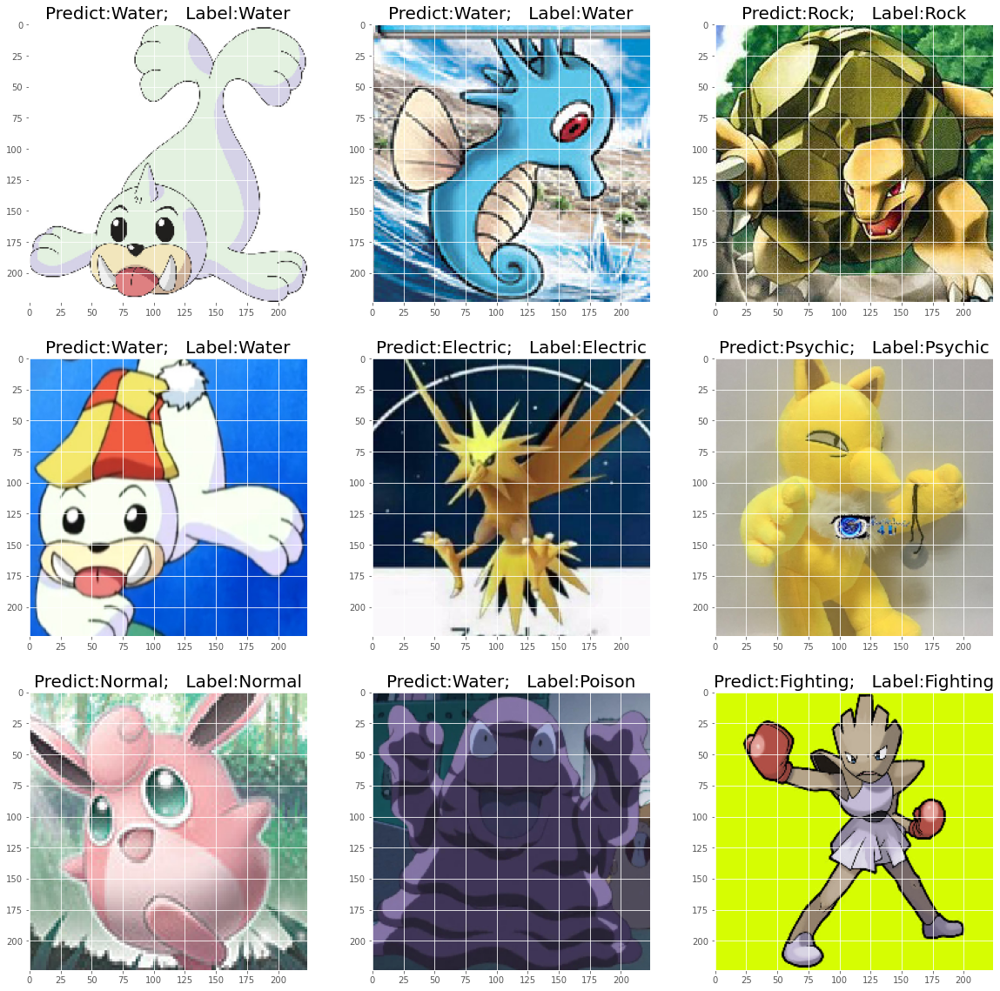

In [38]:
plt.figure(figsize=(20,20))
sam_x,sam_y = next(valida_data) 
pred_ = model.predict(sam_x)
for i in range(9):
    pred,y = pred_[i].argmax(), sam_y[i].argmax()
    plt.subplot(3,3,i+1)
    plt.imshow(sam_x[i])
    title_ = 'Predict:' + str(labels[pred])+ ';   Label:' + str(labels[y])
    plt.title(title_,size=20)
plt.show()

In [20]:
from keras.applications import VGG16
from keras import models
from keras import layers
from keras import optimizers
from keras import regularizers

Path =  'C:/Users/45535/Desktop/Deep Learning Python/Datasets/PokemonData'
Image_dir = Dp(Path)

labels = [item for item in os.listdir(Path)]
labels = np.array(labels)


data_generator = ImageDataGenerator(rescale = 1./255, validation_split=0.2,)

img_shape = (224, 224, 3)

train_data = data_generator.flow_from_directory(
    Path, 
    target_size=(224,224), 
    batch_size=32, 
    classes = list(labels), 
    subset='training')

valida_data = data_generator.flow_from_directory(
    Path, 
    target_size=(224,224), 
    batch_size=32, 
    classes = list(labels), 
    subset='validation')



imported_convnet = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(img_shape))
imported_convnet

imported_convnet.trainable = False 


model = models.Sequential()
model.add(imported_convnet)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(150, activation='sigmoid'))

model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['acc'])


hist = model.fit_generator(
    train_data, 
    epochs=20, 
    steps_per_epoch = train_data.samples//32, 
    validation_data=valida_data, 
    validation_steps = valida_data.samples//32,
    verbose = 2)

Found 5511 images belonging to 150 classes.
Found 1309 images belonging to 150 classes.
Epoch 1/20
 - 47s - loss: 4.6900 - acc: 0.0431 - val_loss: 3.8701 - val_acc: 0.1922
Epoch 2/20
 - 51s - loss: 2.7500 - acc: 0.3590 - val_loss: 2.2625 - val_acc: 0.5450
Epoch 3/20
 - 47s - loss: 1.4182 - acc: 0.6477 - val_loss: 1.4678 - val_acc: 0.6492
Epoch 4/20
 - 46s - loss: 0.8822 - acc: 0.7828 - val_loss: 1.5162 - val_acc: 0.6805
Epoch 5/20
 - 49s - loss: 0.6224 - acc: 0.8483 - val_loss: 1.4235 - val_acc: 0.7197
Epoch 6/20
 - 49s - loss: 0.4360 - acc: 0.8927 - val_loss: 1.1643 - val_acc: 0.7118
Epoch 7/20
 - 49s - loss: 0.3253 - acc: 0.9206 - val_loss: 1.3445 - val_acc: 0.7110
Epoch 8/20
 - 49s - loss: 0.2806 - acc: 0.9345 - val_loss: 1.4533 - val_acc: 0.7189
Epoch 9/20
 - 49s - loss: 0.2485 - acc: 0.9376 - val_loss: 1.0344 - val_acc: 0.7150
Epoch 10/20
 - 49s - loss: 0.1976 - acc: 0.9536 - val_loss: 1.2630 - val_acc: 0.7110
Epoch 11/20
 - 49s - loss: 0.1768 - acc: 0.9586 - val_loss: 0.9223 - va

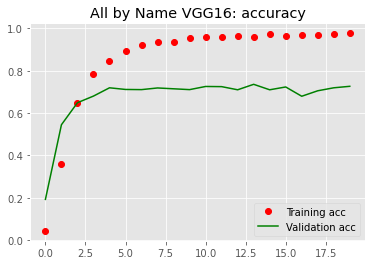

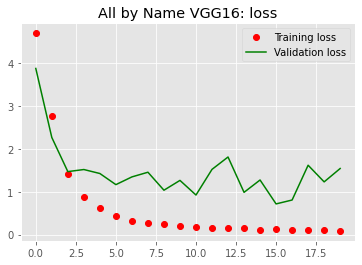

In [24]:
acc = hist.history['acc']
val_acc = hist.history['val_acc']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))


plt.style.use('ggplot')
plt.plot(epochs, acc, 'bo', label='Training acc', color='red')
plt.plot(epochs, val_acc, 'b', label='Validation acc', color='green')
plt.title('All by Name VGG16: accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss', color='red')
plt.plot(epochs, val_loss, 'b', label='Validation loss', color = 'green')
plt.title('All by Name VGG16: loss')
plt.legend()

plt.show()

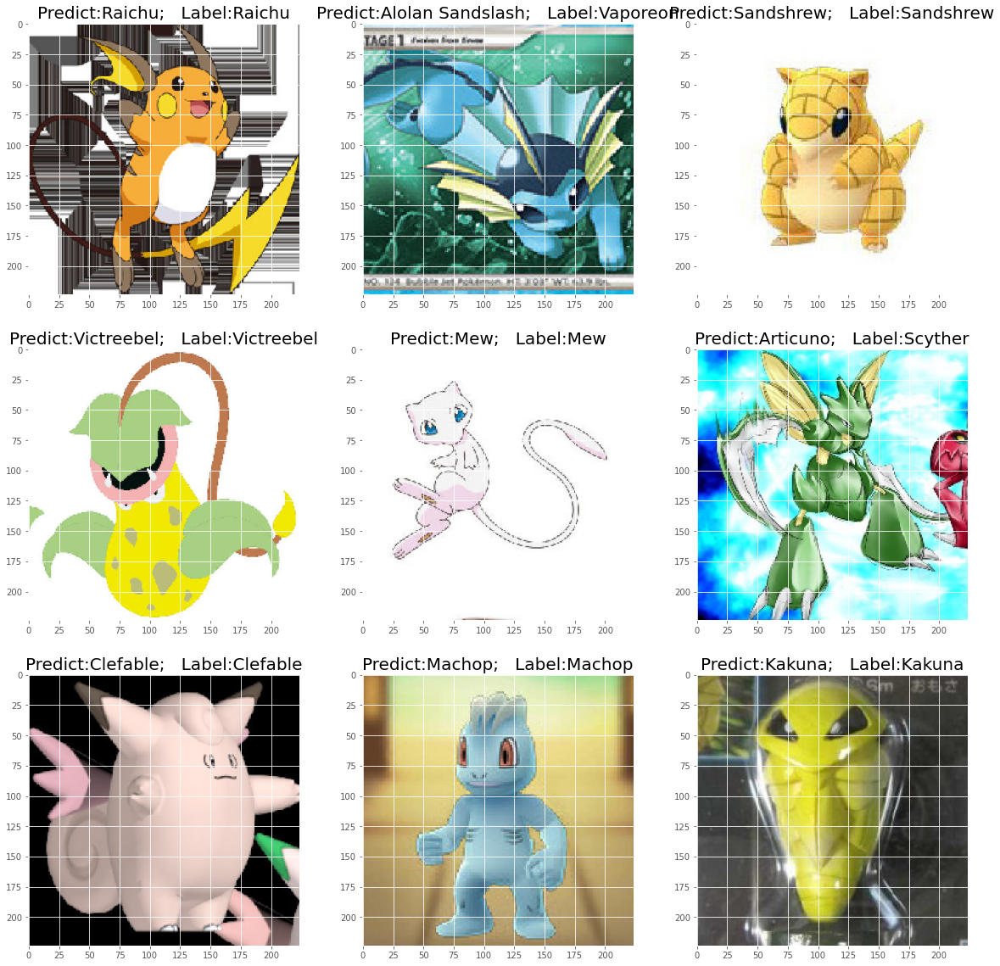

In [23]:
plt.figure(figsize=(20,20))
sam_x,sam_y = next(valida_data) 
pred_ = model.predict(sam_x)
for i in range(9):
    pred,y = pred_[i].argmax(), sam_y[i].argmax()
    plt.subplot(3,3,i+1)
    plt.imshow(sam_x[i])
    title_ = 'Predict:' + str(labels[pred])+ ';   Label:' + str(labels[y])
    plt.title(title_,size=20)
plt.show()

In [ ]:
model.save('VGG19ALLPOKEMON.h5')